# Copy train/tests folders
To avoid uploading large file size, the train, test1, and test2 folders are removed from our submissions.
Please kindly help to copy the folder train, test1, and test1 to this project folder (same location as this file).

# Dependency Installations
Please refer to the file `requirements.txt` for the list of packages used in this program. Some of the specific machine learning libraries, there will be codes regarding installations. However, for those common libraries (such as numpy, matplotlib, etc), we assumed that already available.

# Instructions
Please run the following sections starting from Splitting data until before the Training.
If you would like to continue the training process please consider increase the `max_iter` key in the configuration variable. If you do not want to run the training, it just run through the train section, it will skip the training since we've done the training.

Most of the data was pre-processed so will execute quickly. Those take longer time there was the time recorded using %timeit to let the users know how long it may take.

# Detectron2 installations
Make sure to install detectron2 and its dependencies by enabling the following lines if you haven't done so.


In [1]:
# # install dependencies:
# !pip install pycocotools>=2.0.1
# import torch
# print(torch.__version__, torch.cuda.is_available())
# !gcc --version
# # Make sure also to install opencv (assumed to be pre-installed)
# # install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# # See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# assert torch.__version__.startswith("1.6")
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

# Splitting data

The stratify is by country and then by the damage type with lowest number of occurences.

In [2]:
 %load_ext autotime

In [3]:
from data_processing import split_train_data, process_tests, load_train_eval_splits, load_tests
import warnings
warnings.filterwarnings("ignore")

time: 1.09 s


In [4]:
# Process train/evaluation splits
split_train_data()

Records for train split exists
Records for evaluation split exists
time: 687 µs


In [5]:
# Process tests
process_tests(["test1", "test2"])

test1 exists
test2 exists
time: 1.12 ms


# Loading the processed data

In [6]:
train_dicts, eval_dicts = load_train_eval_splits()
test1_dicts, test2_dicts = load_tests()

time: 145 ms


In [7]:
print(len(train_dicts), len(eval_dicts), len(test1_dicts), len(test2_dicts))

10974 1221 2631 2664
time: 874 µs


# Data Exploration
See split balance

In [8]:
from vis_utils import plot_damage_distributions

time: 214 ms


0 : 5923
1 : 3992
2 : 7513
3 : 5044


[5923, 3992, 7513, 5044]

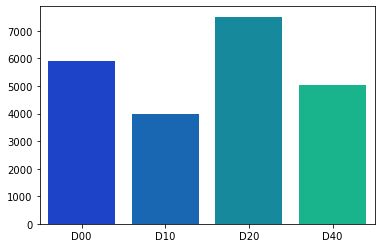

time: 117 ms


In [9]:
plot_damage_distributions(train_dicts)

0 : 669
1 : 454
2 : 868
3 : 583


[669, 454, 868, 583]

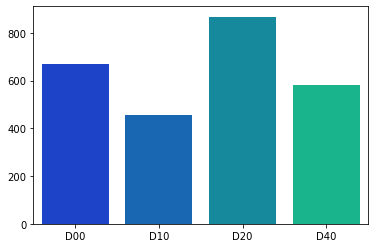

time: 94.9 ms


In [10]:
plot_damage_distributions(eval_dicts)

In [11]:
# Import dependencies
import torch
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from cv2 import imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import ColorMode

import time
import datetime

time: 6.09 ms


# Data Preparation

In [12]:
model_type='r101'
OUTPUT_DIR = f'./{model_type}_output'
OUTPUT_DIR

'./r101_output'

time: 3.34 ms


In [13]:
from data_processing import prepare_data
road_damage_metadata = prepare_data(OUTPUT_DIR, train_dicts, eval_dicts, test1_dicts, test2_dicts)

[10/26 16:55:40 d2.data.datasets.coco]: Converting annotations of dataset 'road_damage_train' to COCO format ...)
[10/26 16:55:40 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[10/26 16:55:43 d2.data.datasets.coco]: Conversion finished, #images: 10974, #annotations: 22472
[10/26 16:55:43 d2.data.datasets.coco]: Caching COCO format annotations at './r101_output/road_damage_train_coco_format.json' ...
[10/26 16:55:44 d2.data.datasets.coco]: Converting annotations of dataset 'road_damage_eval' to COCO format ...)
[10/26 16:55:44 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[10/26 16:55:44 d2.data.datasets.coco]: Conversion finished, #images: 1221, #annotations: 2574
[10/26 16:55:44 d2.data.datasets.coco]: Caching COCO format annotations at './r101_output/road_damage_eval_coco_format.json' ...
[10/26 16:55:44 d2.data.datasets.coco]: Converting annotations of dataset 'road_damage_test1' to COCO format ...)
[10/26 16:55:44 d2.data.datasets.coco]: Conv

In [14]:
from train_helper import configure_model
train_config = {
    'OUTPUT_DIR': OUTPUT_DIR,
    'base_config_file': 'COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml', #"COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml", # X101 is more accurate but slow
    'base_weight_file': 'detectron2://ImageNetPretrained/MSRA/R-101.pkl', # "detectron2://ImageNetPretrained/FAIR/X-101-32x8d.pkl", # X101 is more accurate but slow
    'max_iter': 70000,
    'num_gpus': 2,
    'ims_per_batch': 16,
    'learning_rate': 0.00025
}
cfg = configure_model(**train_config)

time: 10.1 ms


# Training
If you would like to continue the training process please increase the `max_iter` field in the previous cell, otherwise you can continue to run or safely skip the training cell. If you continue to run without changing `max_iter`, since we resume from previous epochs, so it will stop (it is not an error, just continue to evaluation part).

In [15]:
from my_detectron2_trainer import MyTrainer

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = MyTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

[10/26 16:57:42 d2.engine.defaults]: Auto-scaling the config to batch_size=8, learning_rate=0.000125, max_iter=140000, warmup=2000.
[10/26 16:57:45 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), st

WARNING [10/26 16:57:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/26 16:57:45 d2.data.datasets.coco]: Loaded 10974 images in COCO format from ./r101_output/road_damage_train_coco_format.json
[10/26 16:57:45 d2.data.build]: Removed 0 images with no usable annotations. 10974 images left.
[10/26 16:57:45 d2.data.build]: Distribution of instances among all 4 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    D00     | 5923         |    D10     | 3992         |    D20     | 7513         |
|    D40     | 5044         |            |              |            |              |
|   total    | 22472        |            |              |            |              |
[10/26 16:57:45 d2.data.common]: Serializing 10974 elements to byte tensors and concatenating them all ...
[10/26 16:57:45 d2

In [16]:
cfg.OUTPUT_DIR

'./r101_output'

time: 1.98 ms


# View training history via TensorBoard
Please comment the cell belows if you don't have tensorboard.

In [34]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir r101_output --host localhost


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 26696), started 3 days, 17:41:33 ago. (Use '!kill 26696' to kill it.)

time: 7.67 ms


# Evaluations
This section we will evaluate checkpoints at different iterations (specified in `the_max_iters` variable) and select the best model and the best object classification threshold. Tentatively 30 minutes, depending to the hardware's configuration.

In [35]:
import detectron2
import evaluator
from evaluator import predict, evaluate_model, predict_with_tta, evaluate_models, get_evaluation_configuration

time: 356 µs


Evaluating model model_0039999
Done inferences in 1.2827429533004762 minutes at 2020-10-22 04:39:22.185448
model_0039999 max f1 0.5074941946379565 at 0.6400000000000003
Evaluating model model_0044999
Done inferences in 1.276824963092804 minutes at 2020-10-22 04:40:55.804938
model_0044999 max f1 0.5034706154558075 at 0.7500000000000004
Evaluating model model_0049999
Done inferences in 1.2737691124280295 minutes at 2020-10-22 04:42:29.433953
model_0049999 max f1 0.5153452685421995 at 0.5800000000000003
Evaluating model model_0054999
Done inferences in 1.272123142083486 minutes at 2020-10-22 04:44:01.654206
model_0054999 max f1 0.5097864768683273 at 0.7000000000000004
Evaluating model model_0059999
Done inferences in 1.2727732539176941 minutes at 2020-10-22 04:45:35.285059
model_0059999 max f1 0.49573361082206036 at 0.6200000000000003
Evaluating model model_0064999
Done inferences in 1.2734368761380515 minutes at 2020-10-22 04:47:08.623791
model_0064999 max f1 0.5258254000405104 at 0.6200

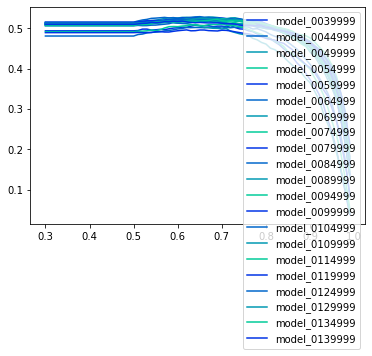

time: 32min 47s


In [36]:
# about 7 minutes each model (might be different depending on hardware configuration)
the_max_iters = [39999, 44999, 49999, 54999, 59999, 64999, 69999, 74999, 79999, 84999, 89999, 94999, 99999, 104999, 109999, 114999, 119999, 124999, 129999, 134999, 139999] #, 144999, 149999, 154999, 159999] # these are the latest checkpoints while training
the_model_names = [f"model_{str(iters).zfill(7)}" for iters in the_max_iters]
model_bests, threshold_bests, f1_bests = evaluate_models(cfg, eval_dicts, the_model_names)

# The best moodel info

In [37]:
print(f'The  best model is {the_model_names[np.argmax(model_bests)]}')
print(f'Its  score  threshold is {threshold_bests[np.argmax(model_bests)]}')
print(f'Its best f1 score is {max(model_bests)}')

The  best model is model_0084999
Its  score  threshold is 0.6500000000000004
Its best f1 score is 0.5285171102661598
time: 1.64 ms


# Use the best model to produce outputs

In [38]:
import numpy as np

from processing_utils import submissions_for_outputs

time: 702 µs


In [39]:
the_best_model = the_model_names[np.argmax(model_bests)]
the_model_name =  the_best_model
the_best_score_threshold = threshold_bests[np.argmax(model_bests)]
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, f"{the_model_name}.pth")

time: 1.24 ms


### test1

In [40]:
# about 7 minutes (might be different depending on hardware configuration)
test1_output_items = predict(test1_dicts, cfg)

Done inferences in 2.6956228454907736 minutes at 2020-10-22 09:01:47.802950
time: 2min 41s


In [41]:
file_name = f'test1'
test1_output_lines = submissions_for_outputs(file_name, test1_dicts, test1_output_items, score_thresh_test=the_best_score_threshold, top_n=5)

Written: test1_0.6500000000000004_20201022_090148.txt at 2020-10-22 09:01:48.453852
time: 634 ms


### test2

In [42]:
# about 7 minutes (might be different depending on hardware configuration)
test2_output_items = predict(test2_dicts, cfg)

Done inferences in 2.765354001522064 minutes at 2020-10-22 09:04:34.387847
time: 2min 45s


In [43]:
file_name = f'test2'
test2_output_lines = submissions_for_outputs(file_name, test2_dicts, test2_output_items, score_thresh_test=the_best_score_threshold, top_n=5)

Written: test2_0.6500000000000004_20201022_090435.txt at 2020-10-22 09:04:35.059595
time: 646 ms


# Visualizations
Visualize 10 images from each test dataset

In [44]:
# force reloading
import vis_utils
import importlib
importlib.reload(vis_utils)
from vis_utils import visualize_sample_outputs

time: 2.36 ms


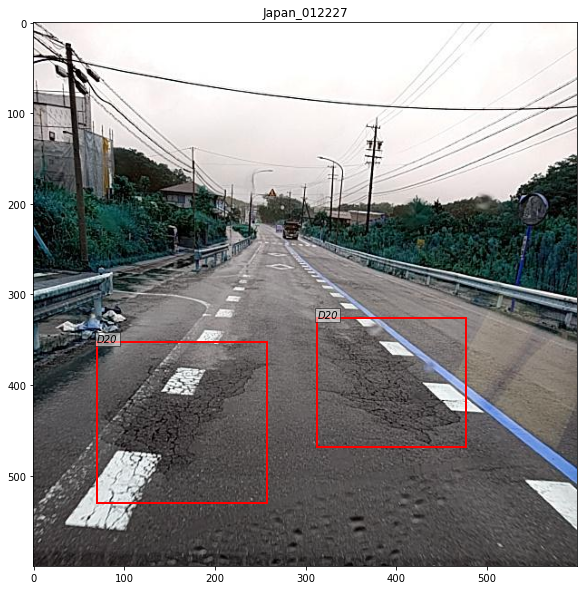

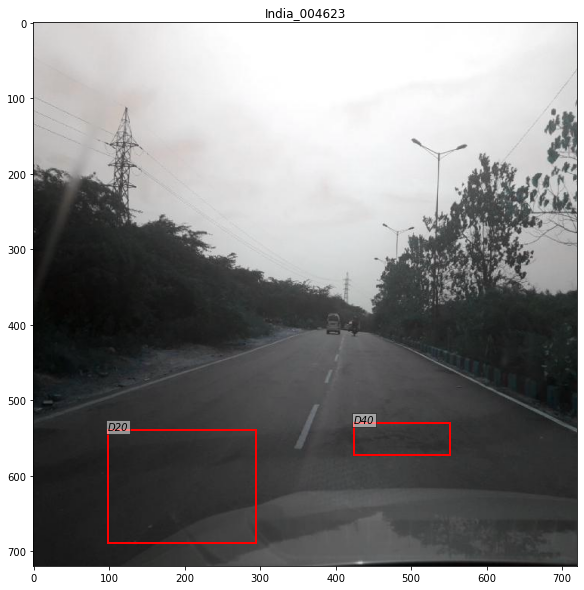

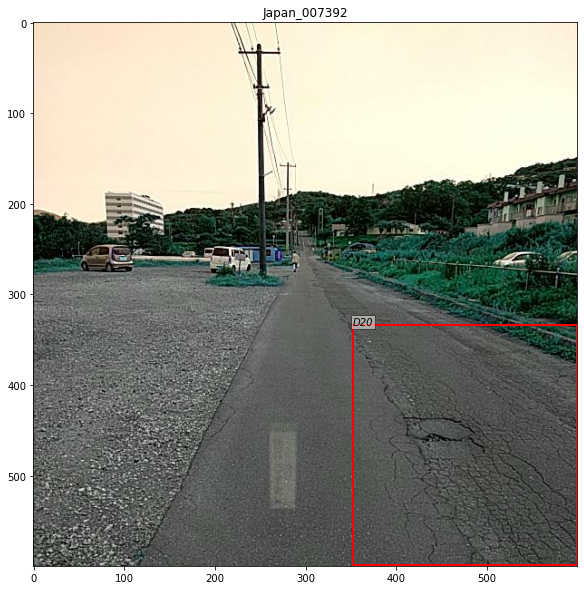

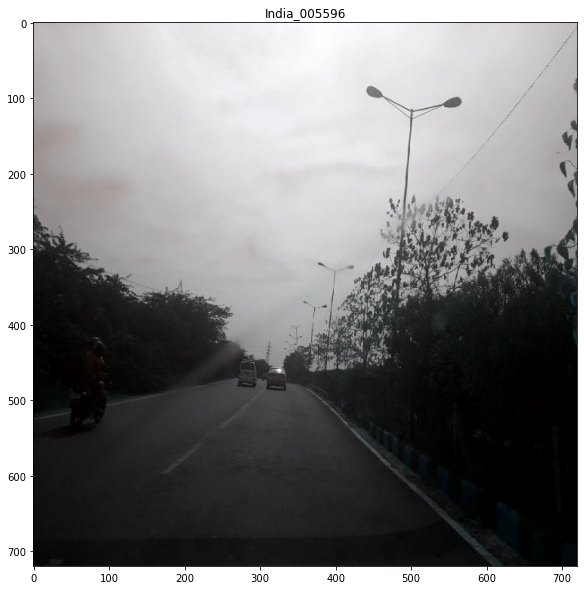

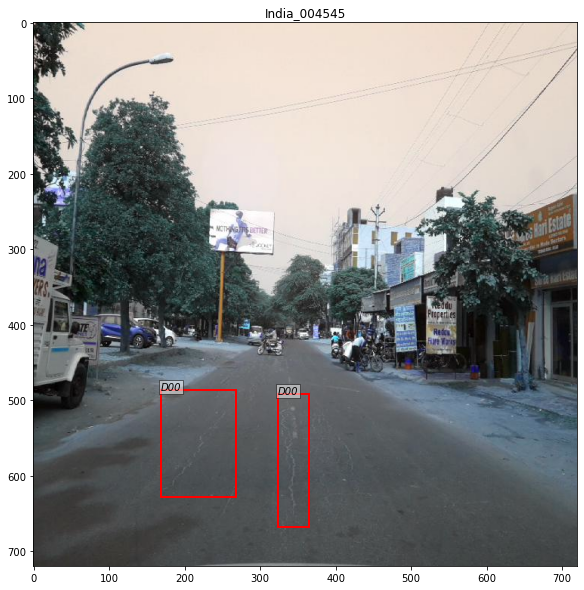

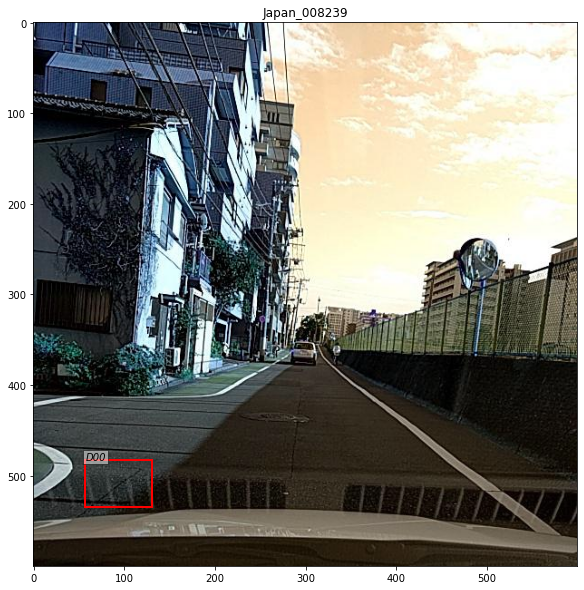

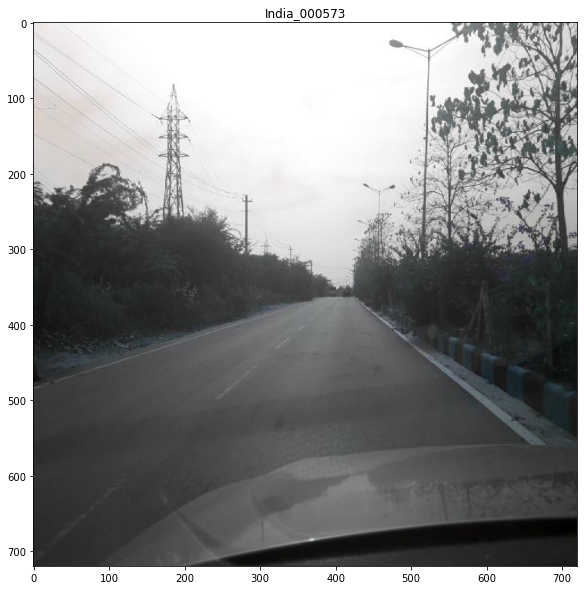

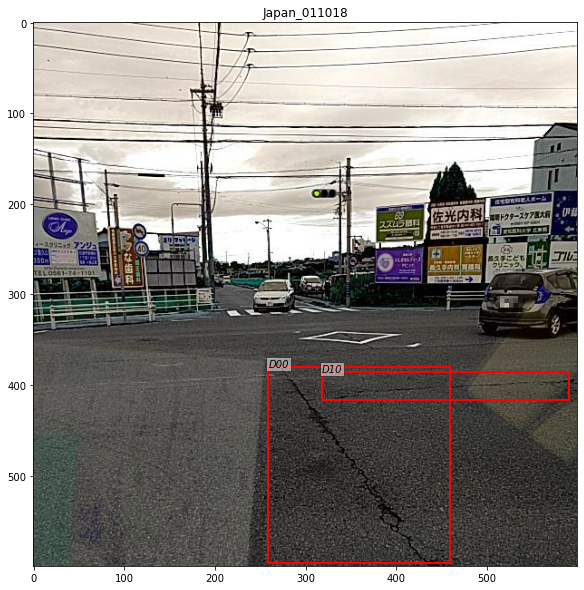

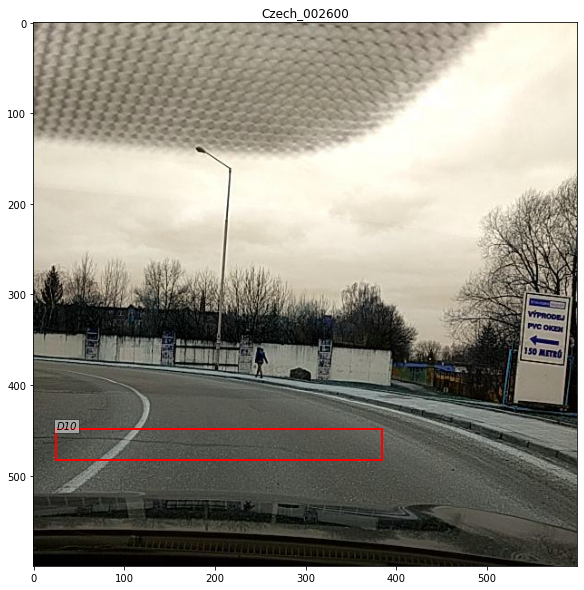

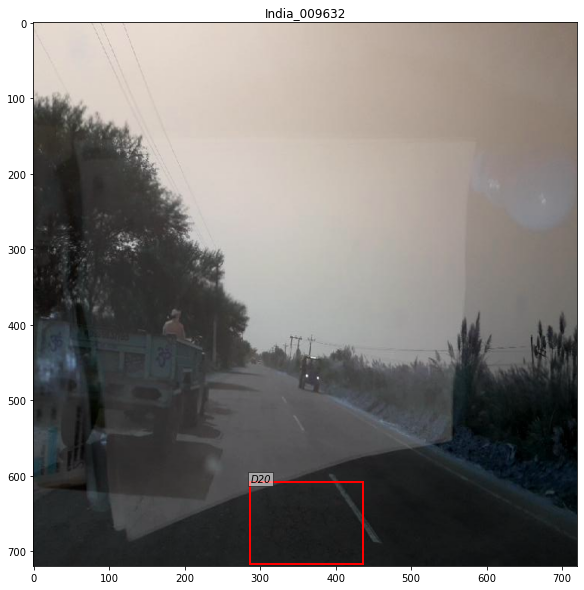

time: 2.38 s


In [45]:
visualize_sample_outputs(test1_dicts, test1_output_lines, 10)

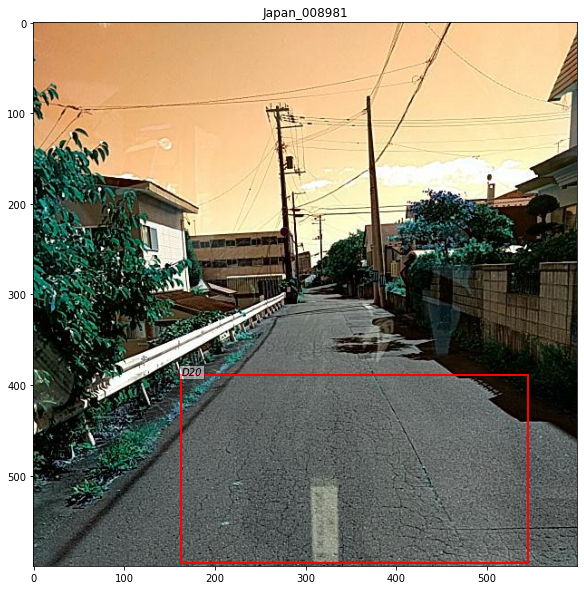

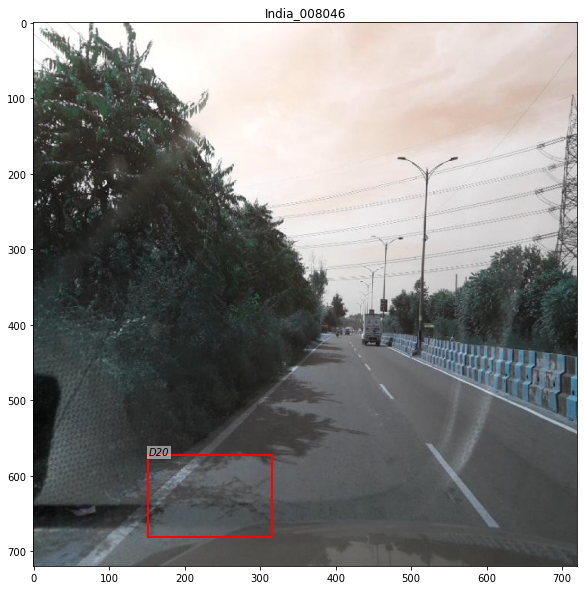

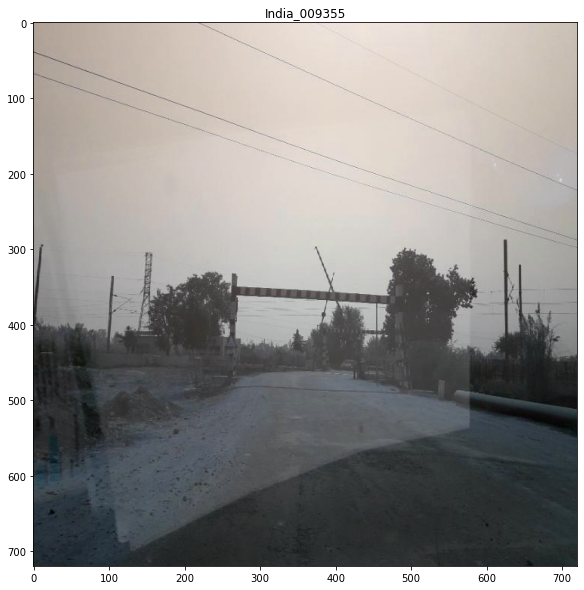

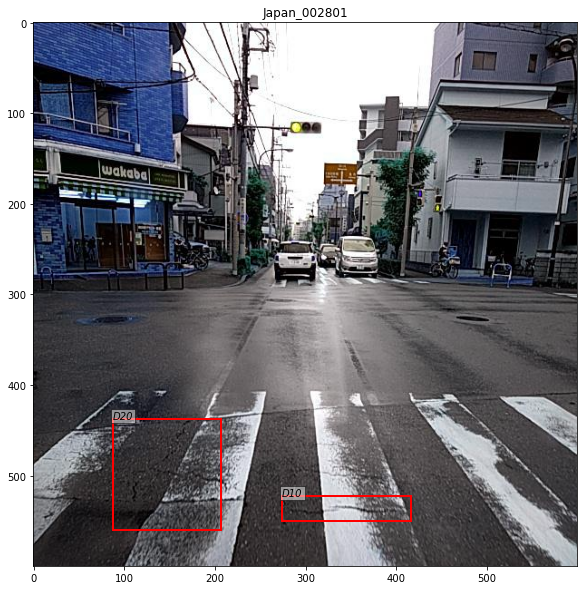

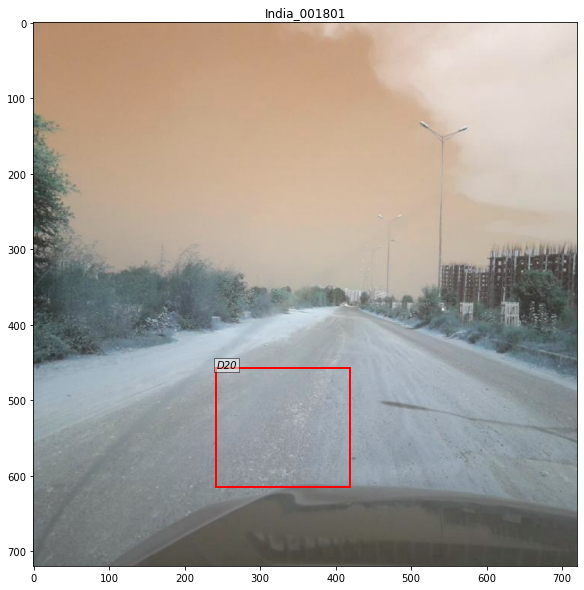

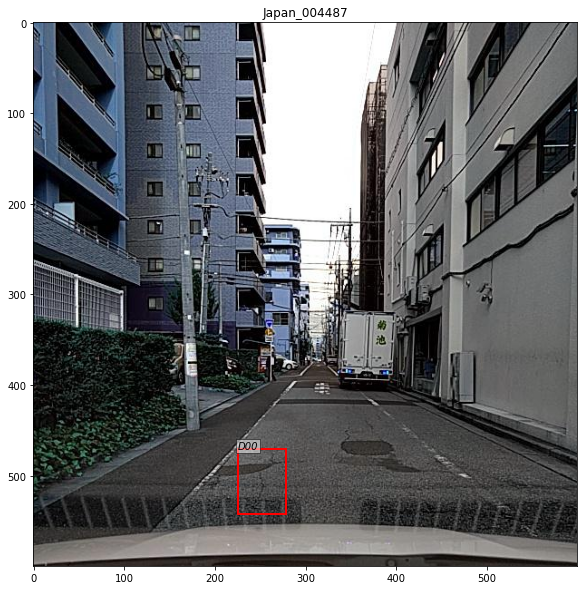

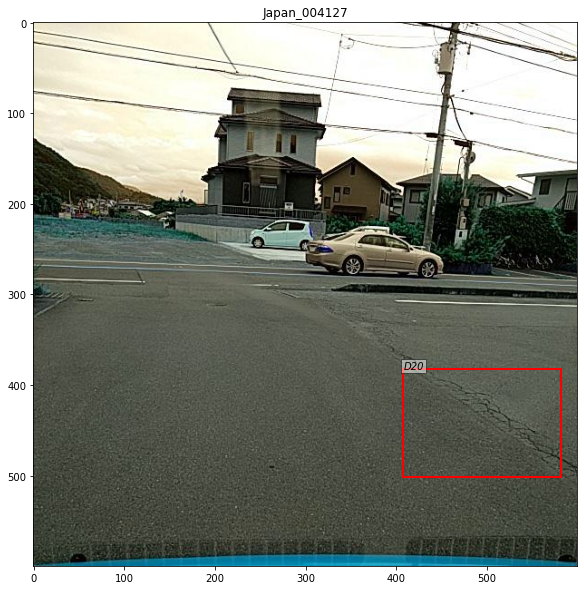

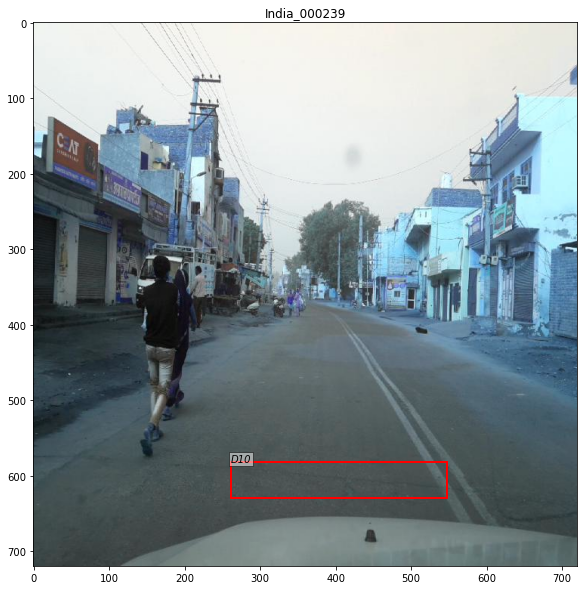

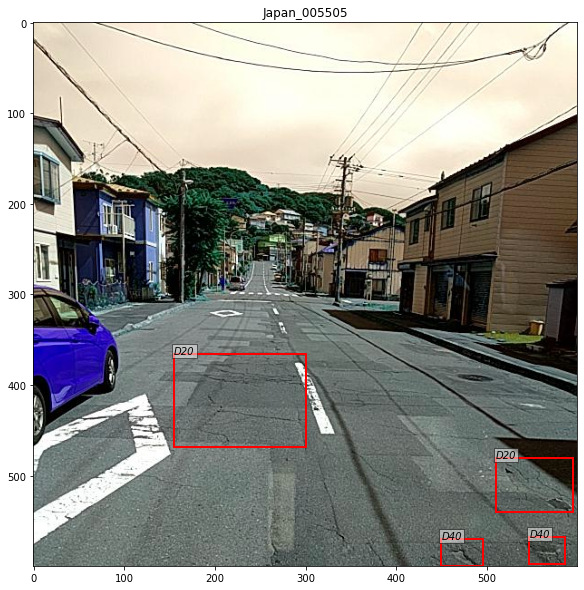

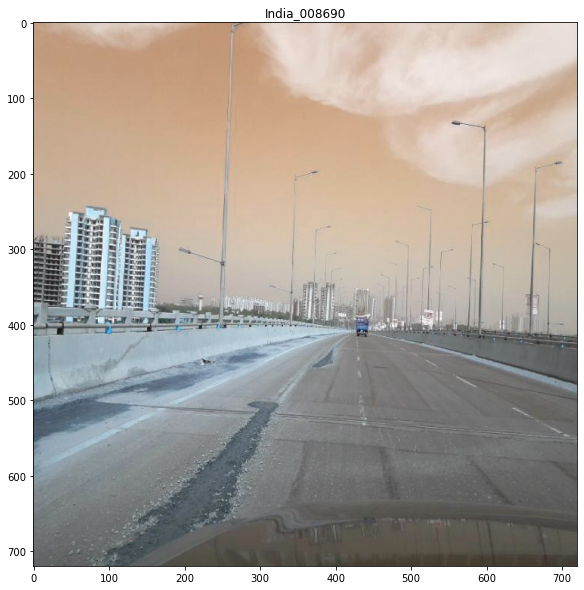

time: 2.7 s


In [46]:
visualize_sample_outputs(test1_dicts, test1_output_lines, 10)